# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset

In [17]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
print(tf.__version__)

2.3.0


In [3]:
%matplotlib inline

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [4]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    
    colors = {1 : 'r', 2 : 'g', 4 : 'b'}
    
    image = batch['image'].numpy()
    h, w, _ = image.shape
    boxes = batch['groundtruth_boxes'].numpy()
    classes = batch['groundtruth_classes'].numpy()
    
    fig = plt.figure(figsize = (10,12))
    axis = fig.add_subplot(1,1,1)
    plt.imshow(image)
       
    for box_, class_ in zip(boxes, classes):
        y1, x1, y2, x2 = box_
        rec = Rectangle((x1*w, y1*h), (x2-x1)*w, (y2-y1)*h, facecolor = 'none', edgecolor = colors[class_])
        axis.add_patch(rec)
    

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

In [5]:
dataset = get_dataset('data/waymo/training_and_validation/segment-*.tfrecord', label_map = 'experiments/label_map.pbtxt')

INFO:tensorflow:Reading unweighted datasets: ['data/waymo/training_and_validation/segment-*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['data/waymo/training_and_validation/segment-*.tfrecord']
INFO:tensorflow:Number of filenames to read: 97
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


In [6]:
dataset = dataset.shuffle(1000)
batch = dataset.take(10)

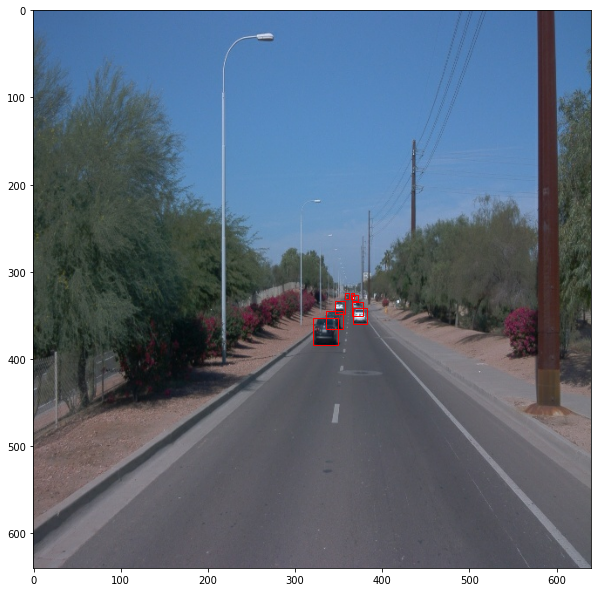

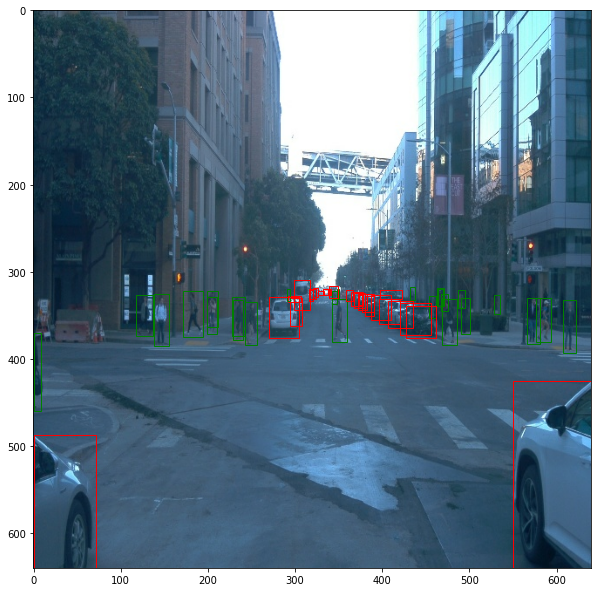

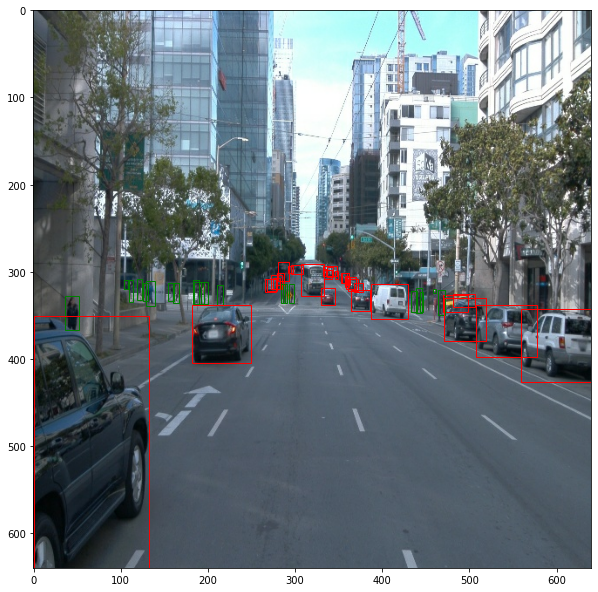

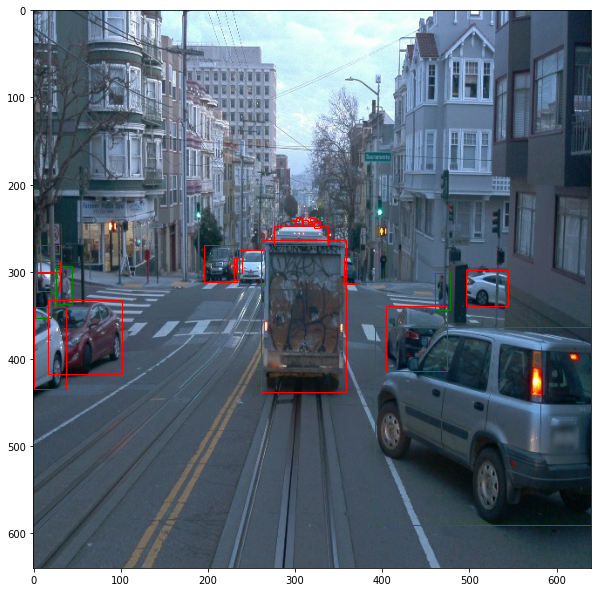

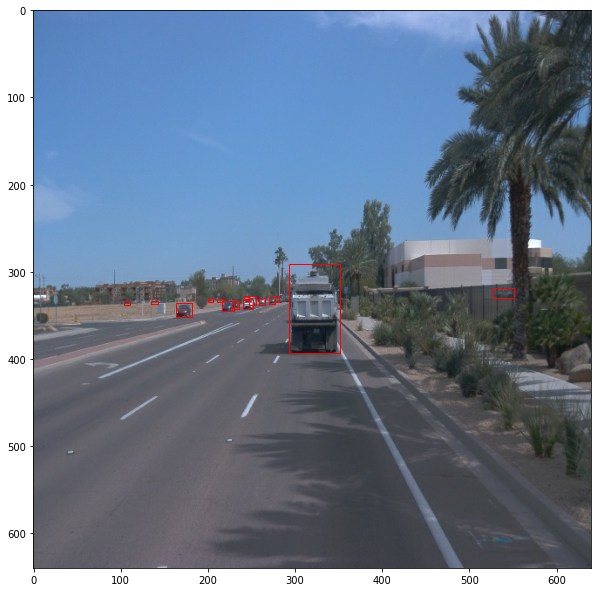

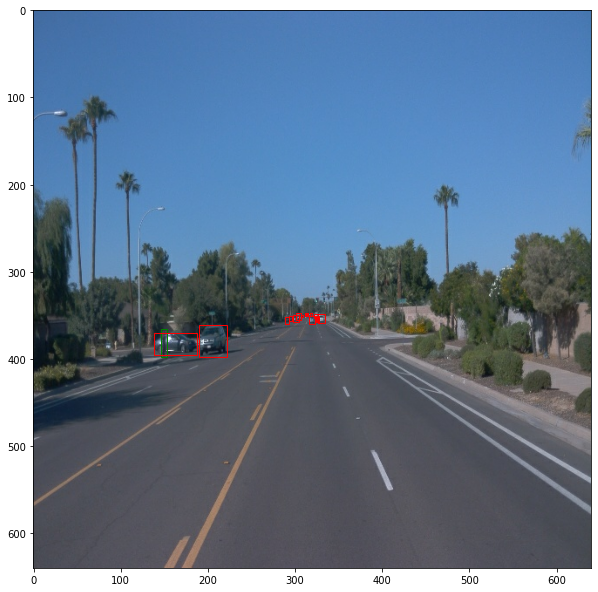

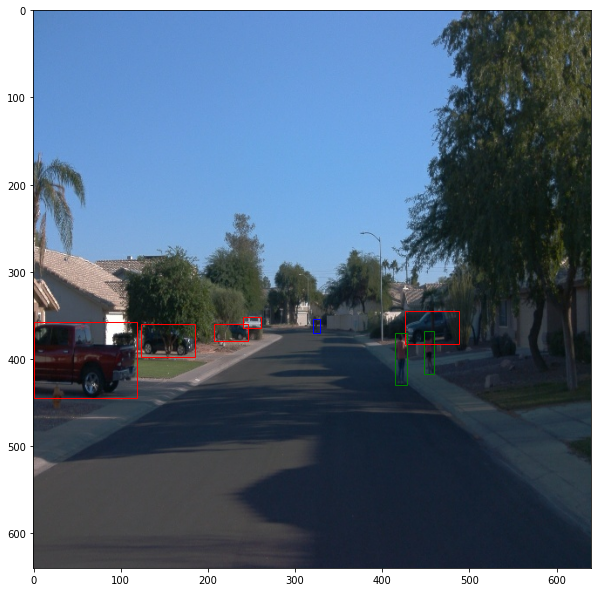

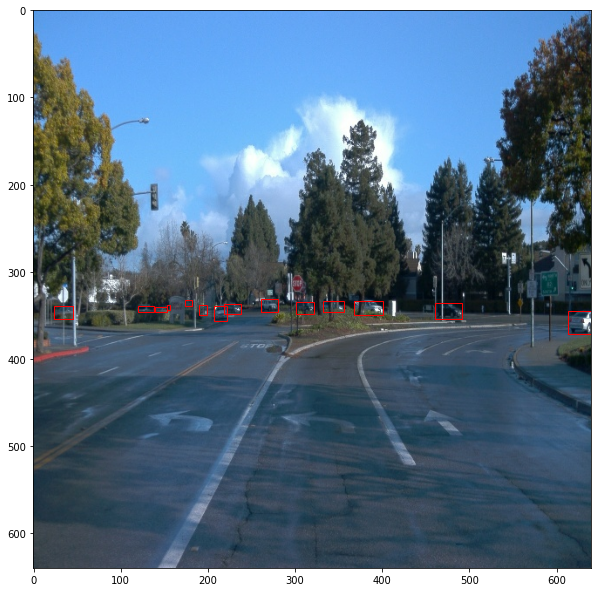

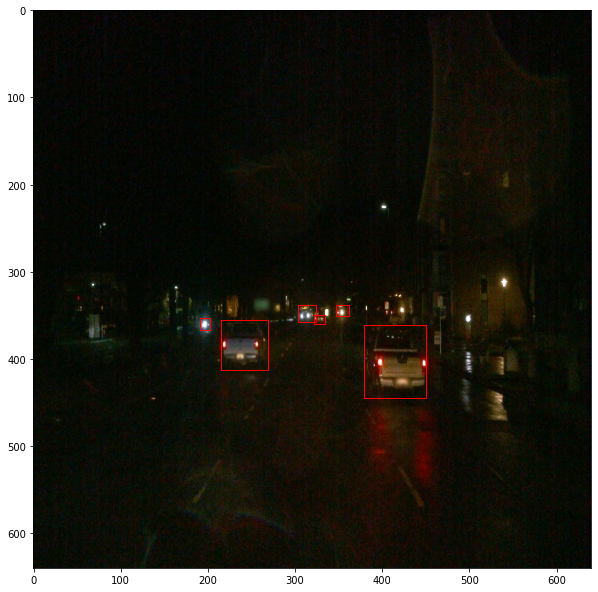

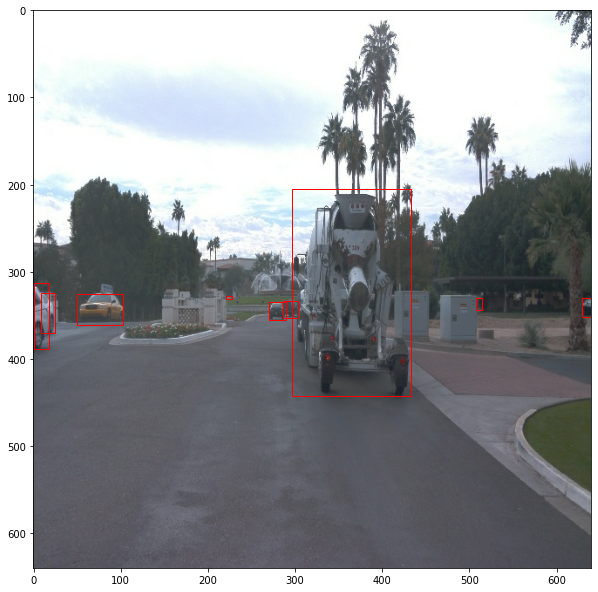

In [7]:
for r in batch:
    display_instances(r)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [8]:
dataset = get_dataset('data/waymo/training_and_validation/segment-*', label_map = 'experiments/label_map.pbtxt')
dataset = dataset.cache()

INFO:tensorflow:Reading unweighted datasets: ['data/waymo/training_and_validation/segment-*']
INFO:tensorflow:Reading record datasets for input file: ['data/waymo/training_and_validation/segment-*']
INFO:tensorflow:Number of filenames to read: 97


Iterate over dataset to get the distribution of the number of bounding boxes in the image

In [52]:
i = 0
seen = set()
number_of_boxes = {}
number_of_cars = {}
number_of_peds = {}
number_of_cycl = {}
size_x = {}
size_y = {}
cars = 0
pedestrians = 0
cyclists = 0
w = 640 
h = 640 

sx_max = 0
r_sx_max = None
sy_max = 0
r_sy_max = None

ncars_max = 0
r_ncars_max = None
npeds_max = 0
r_npeds_max = None
ncycl_max = 0
r_ncycl_max = None
nboxes_max = 0
r_nboxes_max = None

r_zero_boxes = None
cyclists_in_file = dict()
pedestrians_in_file = dict()
cars_in_file = dict()

for r in dataset:
    source_id = str(r['source_id'].numpy())
    start = source_id.find('_with_camera_labels')
    file_label = source_id[2:start]
    
    if file_label not in cyclists_in_file:
        cyclists_in_file[file_label] = 0
    if file_label not in pedestrians_in_file:
        pedestrians_in_file[file_label] = 0
    if file_label not in cars_in_file:
        cars_in_file[file_label] = 0
    
    if source_id not in seen:
        seen.add(source_id)
        already_seen = 0
        
    else:
        already_seen += 1
        if already_seen == 300:
            break
        else:
            continue
            
    
    nseen = len(seen)
    if nseen % 100 == 0:
        print('Updated', nseen, 'images')
        
    count = len(r['groundtruth_boxes'])
    if count in number_of_boxes:
        number_of_boxes[count] += 1
    else:
        number_of_boxes[count] = 1
    if count == 0:
        r_zero_boxes = r.copy()
    if count > nboxes_max:
        r_nboxes_max = r.copy()
        nboxes_max = count
    
    boxes = r['groundtruth_boxes'].numpy()
    for box in boxes:
        y1, x1, y2, x2 = box
        sx = int((x2-x1)*w)
        sy = int((y2-y1)*h)
        if sx in size_x:
            size_x[sx] += 1
        else:
            size_x[sx] = 1
        if sy in size_y:
            size_y[sy] += 1
        else:
            size_y[sy] = 1
        if sx > sx_max and sx != 640:
            r_sx_max = r.copy()
            sx_max = sx
        if sy > sy_max and sy != 640:
            r_sy_max = r.copy()
            sy_max = sy
    classes = r['groundtruth_classes'].numpy()
    cars_in_image = 0
    peds_in_image = 0
    cycl_in_image = 0
    for c in classes:
        if c == 1:
            cars_in_image += 1            
        elif c == 2:
            peds_in_image += 1
        elif c == 4:
            cycl_in_image += 1
        else:
            print('Wrong type')
    if cars_in_image in number_of_cars:
        number_of_cars[cars_in_image] += 1
    else:
        number_of_cars[cars_in_image] = 1
    if peds_in_image in number_of_peds:
        number_of_peds[peds_in_image] += 1
    else:
        number_of_peds[peds_in_image] = 1
    if cycl_in_image in number_of_cycl:
        number_of_cycl[cycl_in_image] += 1
    else:
        number_of_cycl[cycl_in_image] = 1
    cars += cars_in_image  
    pedestrians += peds_in_image
    cyclists += cycl_in_image
    
    cyclists_in_file[file_label] += cycl_in_image
    pedestrians_in_file[file_label] += peds_in_image
    cars_in_file[file_label] += cars_in_image
    
    if cars_in_image > ncars_max:
        r_ncars_max = r.copy()
        ncars_max = cars_in_image
    if peds_in_image > npeds_max:
        r_npeds_max = r.copy()
        npeds_max = peds_in_image
    if cycl_in_image > ncycl_max:
        r_ncycl_max = r.copy()
        ncycl_max = cycl_in_image
    i += 1 
print('Done')   

Updated 100 images
Updated 200 images
Updated 300 images
Updated 400 images
Updated 500 images
Updated 600 images
Updated 700 images
Updated 800 images
Updated 900 images
Updated 1000 images
Updated 1100 images
Updated 1200 images
Updated 1300 images
Updated 1400 images
Updated 1500 images
Updated 1600 images
Updated 1700 images
Updated 1800 images
Updated 1900 images
Done


It can be seen, that there are much more cars in images than pedestrians, and there are only a few cyclists, so classes are rather imbalanced.

In [53]:
print('In', len(seen), 'images there are', cars, 'cars,', pedestrians, 'pedestrians and', cyclists, 'cyclists')

In 1937 images there are 34855 cars, 10423 pedestrians and 270 cyclists


In order to train and validate better, files with cyclist should be splitted proportionally.

Lets us print sorted dict with number of cyclists in segment for segments containing at least one cyclist

In [54]:
cycl_list_nonzero = [x for x in sorted(cyclists_in_file.items(), key=lambda value: value[1], reverse = True) if x[1] > 0]
cycl_list_zero = [x for x in sorted(cyclists_in_file.items(), key=lambda value: value[1], reverse = True) if x[1] == 0]
print('Number of files containing at least one cyclist is', len(cycl_list_nonzero), '\nNumber of files without cyclists is', len(cycl_list_zero))

Number of files containing at least one cyclist is 27 
Number of files without cyclists is 70


Let's permute this list and take first 27 * 0.15 = 4 and 70 * 0.15 files for validation set

In [57]:
perm_cycl_list_nonzero = np.random.permutation(cycl_list_nonzero)[0:4]
perm_cycl_list_zero = np.random.permutation(cycl_list_zero)[0:11]
#print(perm_cycl_list_nonzero[:4])
#print(perm_cycl_list_zero[:11])

rcy = 0
rca = 0
rpe = 0

while True:
    perm_cycl_list_nonzero = np.random.permutation(cycl_list_nonzero)[0:4]
    perm_cycl_list_zero = np.random.permutation(cycl_list_zero)[0:11]
    no_of_cyclists = 0
    no_of_cars = 0
    no_of_pedestrians = 0

    for r in perm_cycl_list_nonzero:
        no_of_cyclists += cyclists_in_file[r[0]]
        no_of_cars += cars_in_file[r[0]]
        no_of_pedestrians += pedestrians_in_file[r[0]]
    for r in perm_cycl_list_zero:
        no_of_cyclists += cyclists_in_file[r[0]]
        no_of_cars += cars_in_file[r[0]]
        no_of_pedestrians += pedestrians_in_file[r[0]]
    
    rcy = no_of_cyclists/cyclists
    rca = no_of_cars/cars
    rpe = no_of_pedestrians/pedestrians
    if rcy < 0.16 and rcy > 0.14 and rca < 0.16 and rca > 0.14 and rpe < 0.16 and rpe > 0.14:
        with open('validation.txt', 'w') as f:
            for r in perm_cycl_list_nonzero:
                f.write('%s\n' % str(r[0]))
            for r in perm_cycl_list_zero:
                f.write('%s\n' % r[0])
        break
print(rcy, rca, rpe)

0.14444444444444443 0.14118490890833452 0.14640698455339154


Only 27 of segments includes at least one cyclist, so these segments should be distributed proportionally between training, validation and test sets.

Lets us print sorted dict with number of pedestrians in segment for segments containing at least one pedestrian

In [12]:
[x for x in sorted(pedestrians_in_file.items(), key=lambda value: value[1], reverse = True) if x[1] > 0]

[("b'segment-11070802577416161387_740_000_760_000", 752),
 ("b'segment-11236550977973464715_3620_000_3640_000", 701),
 ("b'segment-11113047206980595400_2560_000_2580_000", 698),
 ("b'segment-10485926982439064520_4980_000_5000_000", 661),
 ("b'segment-11252086830380107152_1540_000_1560_000", 586),
 ("b'segment-11925224148023145510_1040_000_1060_000", 511),
 ("b'segment-10664823084372323928_4360_000_4380_000", 412),
 ("b'segment-10023947602400723454_1120_000_1140_000", 393),
 ("b'segment-11940460932056521663_1760_000_1780_000", 350),
 ("b'segment-11967272535264406807_580_000_600_000", 348),
 ("b'segment-11718898130355901268_2300_000_2320_000", 312),
 ("b'segment-10498013744573185290_1240_000_1260_000", 306),
 ("b'segment-11928449532664718059_1200_000_1220_000", 296),
 ("b'segment-10599748131695282446_1380_000_1400_000", 290),
 ("b'segment-11847506886204460250_1640_000_1660_000", 289),
 ("b'segment-10444454289801298640_4360_000_4380_000", 274),
 ("b'segment-11674150664140226235_680_000_70

70 segments contain at least one pedestrian, so in this respect set is much more balanced

In [13]:
sorted(cars_in_file.items(), key=lambda value: value[1], reverse = True)

[("b'segment-10072140764565668044_4060_000_4080_000", 1010),
 ("b'segment-11846396154240966170_3540_000_3560_000", 970),
 ("b'segment-10625026498155904401_200_000_220_000", 905),
 ("b'segment-11940460932056521663_1760_000_1780_000", 858),
 ("b'segment-10927752430968246422_4940_000_4960_000", 748),
 ("b'segment-11925224148023145510_1040_000_1060_000", 747),
 ("b'segment-10235335145367115211_5420_000_5440_000", 674),
 ("b'segment-10455472356147194054_1560_000_1580_000", 666),
 ("b'segment-11318901554551149504_520_000_540_000", 663),
 ("b'segment-10153695247769592104_787_000_807_000", 647),
 ("b'segment-10723911392655396041_860_000_880_000", 646),
 ("b'segment-11392401368700458296_1086_429_1106_429", 630),
 ("b'segment-11674150664140226235_680_000_700_000", 630),
 ("b'segment-11928449532664718059_1200_000_1220_000", 616),
 ("b'segment-10923963890428322967_1445_000_1465_000", 610),
 ("b'segment-10231929575853664160_1160_000_1180_000", 606),
 ("b'segment-11236550977973464715_3620_000_3640_0

All segments contain cars in corresponding frames, so segments can be splitted randomly with respect to cars

# Distributions of parameters

In this section we consider distributions of different parameters, such as number of bboxes, sizes etc.

In [396]:
def plot_distribution(dictionary, title, label_x, label_y, color, xmax = None):
    nb = sorted(dictionary.items())
    axis = [x[0] for x in nb]
    values = [x[1] for x in nb]
    
    plt.bar(axis, values, color=color)
    if xmax is None:
        xmax = axis[-1] + 1
    plt.xlim([0, xmax])
    plt.title(title)
    plt.xlabel(label_x)
    plt.ylabel(label_y);

First of all, count number of objects in images

There can be really large number of objects in one image (>75)

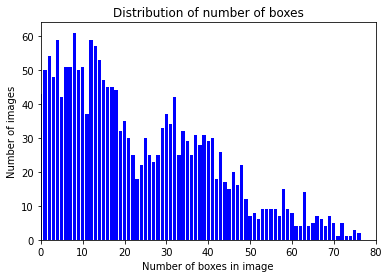

In [397]:
plot_distribution(number_of_boxes, 'Distribution of number of boxes', 'Number of boxes in image', 'Number of images', 'b', xmax = 80)

The image with the largest number of cars

The maximum number of boxes is 76


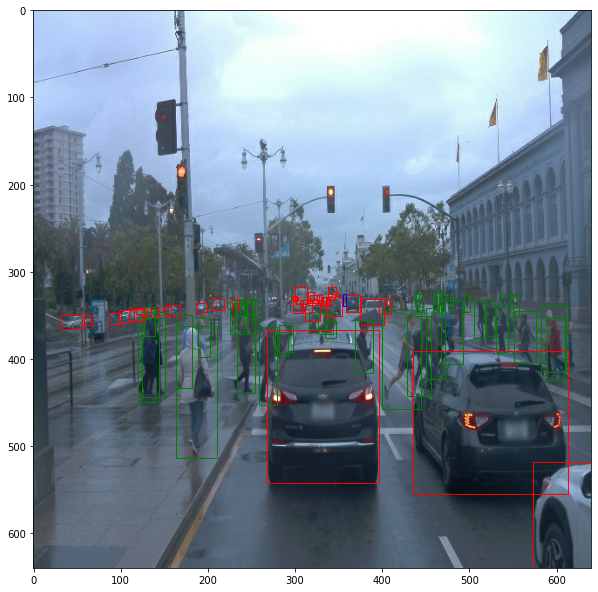

In [398]:
print('The maximum number of boxes is', nboxes_max)
display_instances(r_nboxes_max)

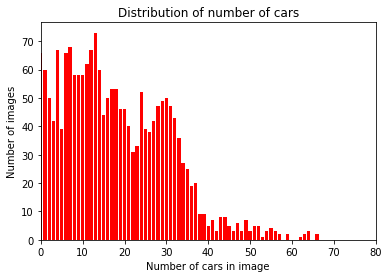

In [399]:
plot_distribution(number_of_cars, 'Distribution of number of cars', 'Number of cars in image', 'Number of images', 'r', xmax = 80)

The image with the largest number of cars

The maximum number of cars is 66


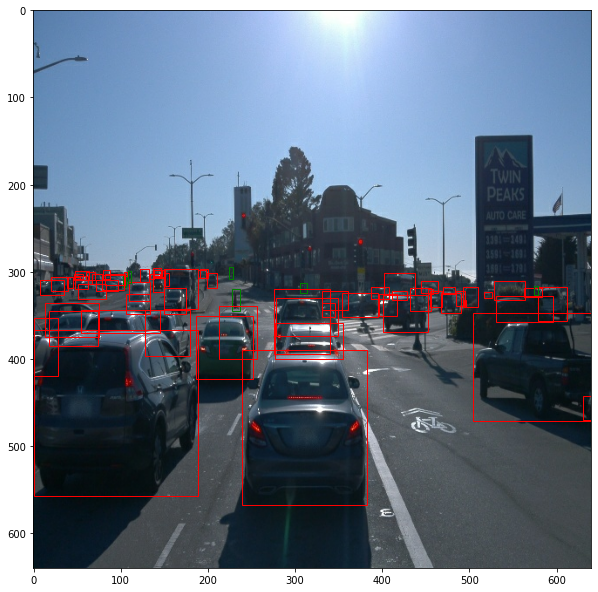

In [400]:
print('The maximum number of cars is', ncars_max)
display_instances(r_ncars_max)

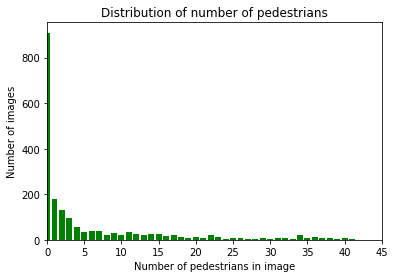

In [401]:
plot_distribution(number_of_peds, 'Distribution of number of pedestrians', 'Number of pedestrians in image', 'Number of images', 'g', xmax = 45)

The image with the largest number of pedestrians

The maximum number of pedestrians is 44


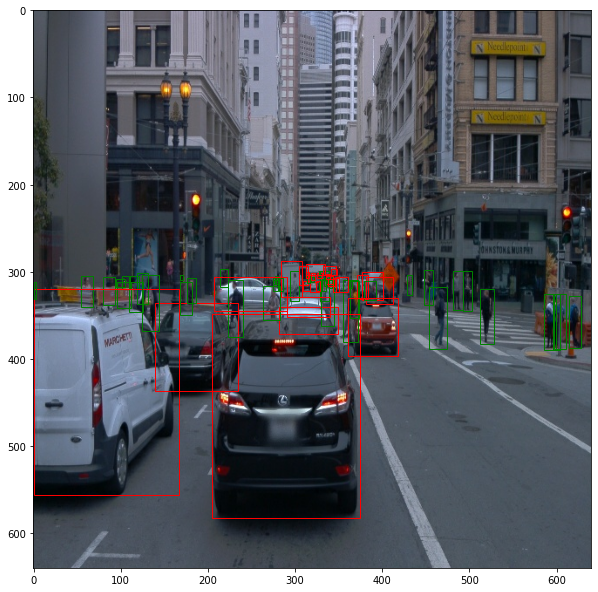

In [402]:
print('The maximum number of pedestrians is', npeds_max)
display_instances(r_npeds_max)

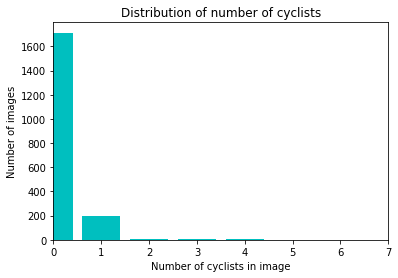

In [403]:
plot_distribution(number_of_cycl, 'Distribution of number of cyclists', 'Number of cyclists in image', 'Number of images', 'c', xmax = 7)

The image with the largest number of cyclists

The maximum number of cyclists is 6


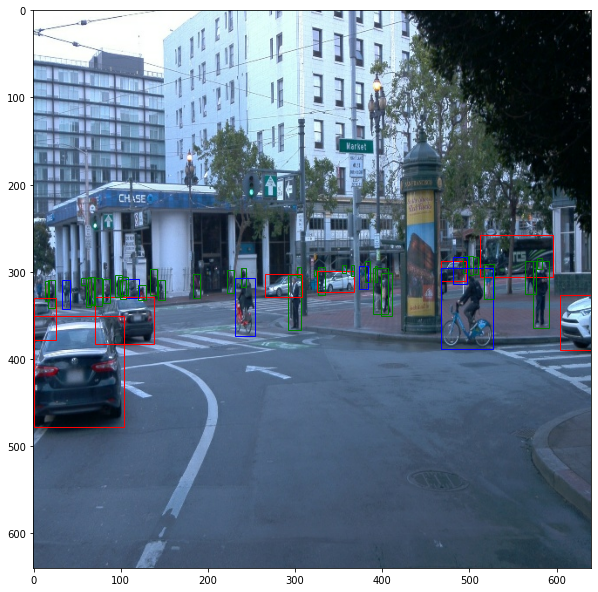

In [404]:
print('The maximum number of cyclists is', ncycl_max)
display_instances(r_ncycl_max)

Next we plot the distribution of bounding box size along x axis. The the mode of distribution is close to 10 px, while there are some really large boxes

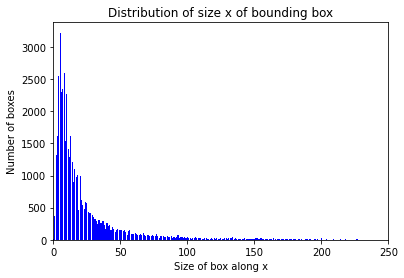

In [405]:
plot_distribution(size_x, 'Distribution of size x of bounding box', 'Size of box along x', 'Number of boxes', 'b', xmax = 250)

The image with the maximum size of box along x, surprisingly, this box is related to real bus
bounding box.

The maximum size along x is 639


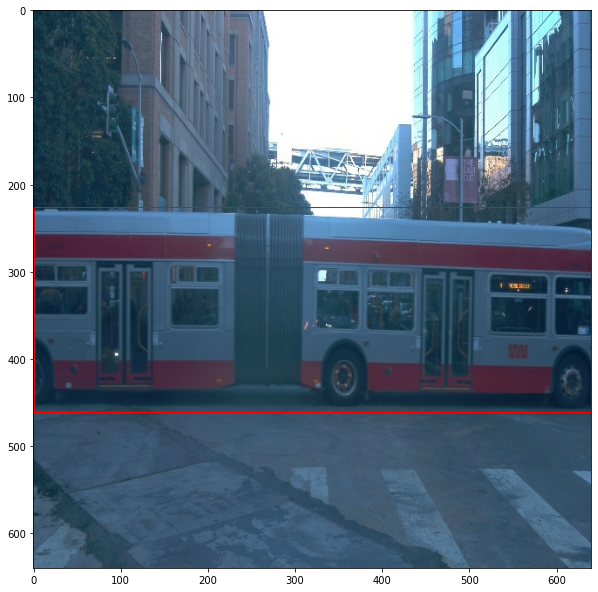

In [406]:
print('The maximum size along x is', sx_max)
display_instances(r_sx_max)

Next we plot the distribution of bounding box size along y axis. The distribution is slightly wider than for x axis. The mode of distribution is also close to 10 px, while there are some really large boxes

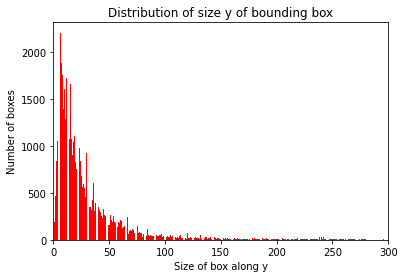

In [407]:
plot_distribution(size_y, 'Distribution of size y of bounding box', 'Size of box along y', 'Number of boxes',  'r', xmax = 300)

The image with the maximum size of box along y, this box is related to incorrect
bounding box.

The maximum size along y is 603


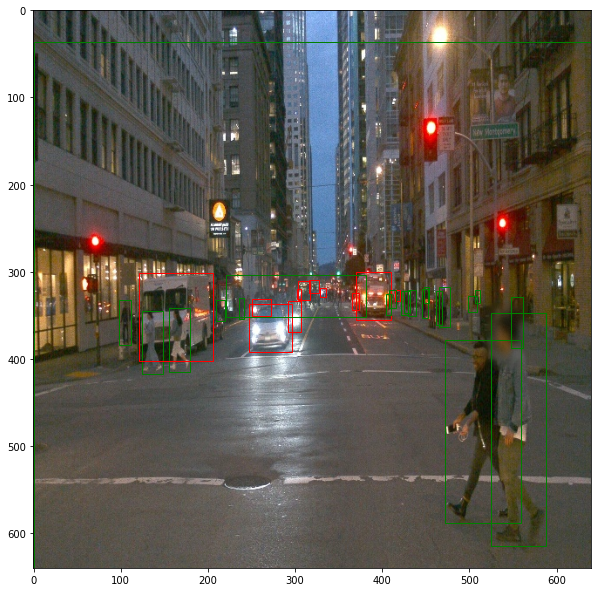

In [408]:
print('The maximum size along y is', sy_max)
display_instances(r_sy_max)

There are also images without objects

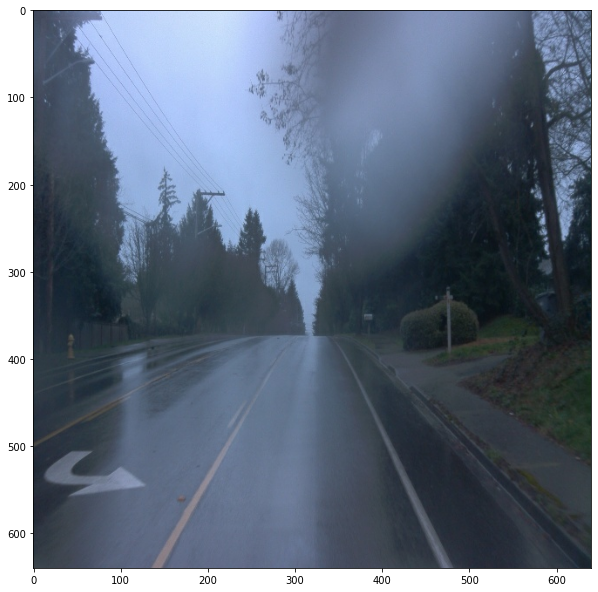

In [409]:
display_instances(r_zero_boxes)